## Plots of vertical diffusive flux components

Diffusive tracer transport $\Phi_{Tdiff}$ from model output (Includes diffusion due to advection scheme)

| variable  | dims | units | description |
|:---------:|:---------:|:---------:|:---------:|
| DFrETr01  |   (T, Zld000090, Y, X)   | Mol/L.m^3/s| Vertical Diffusive Flux of Tr1 (Explicit part) |
| DFrITr01  |   (T, Zld000090, Y, X)   | Mol/L.m^3/s| Vertical Diffusive Flux of Tr1 (Implicit part) |

DFrE has the leaked diffusivity from GMREDI into the vertical. It is negative because it is a correction to DFrI.

DFrI is the implicit calculation of diffusivity plus the numerical diffusivity from the advetion scheme.

I divided each cell $i,j$ by its corresponding area $rA(i,j)$ to get units of flux (as in $\Phi_{diff}=\kappa_v\partial C/\partial z$)

In [2]:

import matplotlib.pyplot as plt
%matplotlib inline
from netCDF4 import Dataset
import numpy as np
import seaborn as sns
import xarray as xr


In [8]:
# set seaborn preferences

sns.set_context('notebook')
sns.set_style(style='white')
sns.set_palette('Set1')


In [6]:

## Set paths ##
grid_file = '/ocean/kramosmu/MITgcm/TracerExperiments/CNTDIFF/run38/gridGlob.nc'

# Base case (kv=1E-5, N=5.5E-3, f=9.66E-5)
flux_file38 = '/ocean/kramosmu/MITgcm/TracerExperiments/CNTDIFF/run38/FluxTR01Glob.nc'  
# high kv everywhere (1E-3 m^2s^-1)
flux_file63 = '/ocean/kramosmu/MITgcm/TracerExperiments/CNTDIFF/run63/FluxTR01Glob.nc' 
# high kv canyon (1E-3 m^2s^-1)
flux_file3D06 = '/ocean/kramosmu/MITgcm/TracerExperiments/3DDIFF/run06/FluxTR01Glob.nc'
# high kv canyon (1E-4 m^2s^-1)
flux_file3D07 = '/ocean/kramosmu/MITgcm/TracerExperiments/3DDIFF/run07/FluxTR01Glob.nc'
# low stratification (3.0E-3 s^-1)
flux_file46 = '/ocean/kramosmu/MITgcm/TracerExperiments/CNTDIFF/run46/FluxTR01Glob.nc' 
# low f (4.84E-5 s^-1)
flux_file52 = '/ocean/kramosmu/MITgcm/TracerExperiments/CNTDIFF/run52/FluxTR01Glob.nc' 

## open datasets ##
grid = xr.open_dataset(grid_file)
flux38 = xr.open_dataset(flux_file38)
flux63 = xr.open_dataset(flux_file63)
flux3D06 = xr.open_dataset(flux_file3D06)
flux3D07 =  xr.open_dataset(flux_file3D07)
flux46 = xr.open_dataset(flux_file46)
flux52 = xr.open_dataset(flux_file52)

# Variable names
varn = {'expDF':'DFrETr01', 'impDF':'DFrITr01','advF':'ADVrTr01'}


## Vertical diffusive flux at different depths

* Changing Bu, effect of N and f (run38, run46, run52)

* Changing Kv locally and globally (run38, run63, run3D06, run3D07)

|Exp |Description |
|:-----:|:---------------------------------------:|
|run38 |Base case ($\kappa_v=10^{-5}$, $N=5.5\times10^{-3}$, $f=9.66\times10^{-5}$) |
|run63 |high kv everywhere ($10^{-3}$ $m^2s^{-1}$) |
|run3D06 |high kv canyon ($10^{-3}$ $m^2s^{-1}$) |
|run3D07 |high kv canyon ($10^{-4}$ $m^2s^{-1}$) |
|run46 |low stratification ($3.0\times10^{-3}$ $s^{-1}$) |
|run52 |low f ($4.84\times10^{-5}$ $s^{-1}$) |


### Statification and Coriolis parameter 

In [147]:
def make_fig_Bu(tt,zz,cmap='spectral',xslice=slice(0,360),yslice=slice(0,360)):    
    
    # Set figure and axis
    fig, ax = plt.subplots(3, 3, figsize=(16,12), sharex=True, sharey=True)

    # Find mask from open cell fractions
    Mask = np.ma.masked_equal(grid.HFacC.isel(Z=zz),0)
    
    # Select what to plot
    flux_I_38 = np.ma.masked_array(flux38.DFrITr01.isel(T=tt,Zld000090=zz,X=xslice,Y=yslice).data/ \
                                   grid.rA.isel(X=xslice,Y=yslice),
                                   mask=Mask[yslice,xslice].mask)
    
    flux_I_46 = np.ma.masked_array(flux46.DFrITr01.isel(T=tt,Zld000090=zz,X=xslice,Y=yslice).data/ \
                                   grid.rA.isel(X=xslice,Y=yslice),
                                   mask=Mask[yslice,xslice].mask)
    
    flux_I_52 = np.ma.masked_array(flux52.DFrITr01.isel(T=tt,Zld000090=zz,X=xslice,Y=yslice).data/ \
                                   grid.rA.isel(X=xslice,Y=yslice),
                                   mask=Mask[yslice,xslice].mask)

    flux_E_38 = np.ma.masked_array(flux38.DFrETr01.isel(T=tt,Zld000090=zz,X=xslice,Y=yslice).data/ \
                                   grid.rA.isel(X=xslice,Y=yslice),
                                   mask=Mask[yslice,xslice].mask)
    
    flux_E_46 = np.ma.masked_array(flux46.DFrETr01.isel(T=tt,Zld000090=zz,X=xslice,Y=yslice).data/ \
                                   grid.rA.isel(X=xslice,Y=yslice),
                                   mask=Mask[yslice,xslice].mask)
    
    flux_E_52 = np.ma.masked_array(flux52.DFrETr01.isel(T=tt,Zld000090=zz,X=xslice,Y=yslice).data/ \
                                   grid.rA.isel(X=xslice,Y=yslice),
                                   mask=Mask[yslice,xslice].mask)

    # Define colormap limits
    cmaxI = flux_I_46.max()
    cminI = flux_I_46.min()

    cmaxE = (-flux_E_46).max()
    cminE = (-flux_E_46).min()

    cmaxT = (flux_E_46 + flux_I_46).max()
    cminT = (flux_E_46 + flux_I_46).min()

    # Plot
    cnf1 = ax[0,0].contourf(grid.X.isel(X=xslice),grid.Y.isel(Y=yslice),flux_I_38,
                            20,
                            cmap='spectral',
                            vmax=cmaxI,
                            vmin=cminI,
                           )
    cb1 = plt.colorbar(cnf1,ax=ax[0,0])
    ax[0,0].set_title('DFr Implicit, Base Case, day %1.1f, depth %1.1f' %((tt/2.0)+0.5, grid.Z[zz]))

    cnf2 = ax[1,0].contourf(grid.X.isel(X=xslice),grid.Y.isel(Y=yslice),flux_I_46,
                            20,
                            cmap='spectral',
                            vmax=cmaxI,
                            vmin=cminI,
                           )
    cb2 = plt.colorbar(cnf2,ax=ax[1,0])
    ax[1,0].set_title('DFr Implicit, Low N, day %1.1f, depth %1.1f' %((tt/2.0)+0.5, grid.Z[zz]))

    cnf3 = ax[2,0].contourf(grid.X.isel(X=xslice) ,grid.Y.isel(Y=yslice) ,flux_I_52,
                            20,
                            cmap='spectral',
                            vmax=cmaxI,
                            vmin=cminI,
                           )
    cb3 = plt.colorbar(cnf2,ax=ax[2,0])
    ax[2,0].set_title('DFr Implicit, Low f, day %1.1f, depth %1.1f' %((tt/2.0)+0.5, grid.Z[zz]))
    
    cnf4 = ax[0,1].contourf(grid.X.isel(X=xslice) ,grid.Y.isel(Y=yslice) ,-flux_E_38,
                            20,
                            cmap='spectral',
                            vmax=cmaxE,
                            vmin=cminE,
                           )
    cb4 = plt.colorbar(cnf4,ax=ax[0,1])
    ax[0,1].set_title('-DFr Explict, Base Case, day %1.1f, depth %1.1f' %((tt/2.0)+0.5, grid.Z[zz]))

    cnf5 = ax[1,1].contourf(grid.X.isel(X=xslice) ,grid.Y.isel(Y=yslice) ,-flux_E_46,
                            20,
                            cmap='spectral',
                            vmax=cmaxE,
                            vmin=cminE,
                           )
    cb5 = plt.colorbar(cnf5,ax=ax[1,1])
    ax[1,1].set_title('-DFr Explict, Low N, day %1.1f, depth %1.1f' %((tt/2.0)+0.5, grid.Z[zz]))

    cnf6 = ax[2,1].contourf(grid.X.isel(X=xslice) ,grid.Y.isel(Y=yslice) ,-flux_E_52,
                            20,
                            cmap='spectral',
                            vmax=cmaxE,
                            vmin=cminE,
                           )
    cb6 = plt.colorbar(cnf6,ax=ax[2,1])
    ax[2,1].set_title('-DFr Explict, Low f, day %1.1f, depth %1.1f' %((tt/2.0)+0.5, grid.Z[zz]))
    
    cnf7 = ax[0,2].contourf(grid.X.isel(X=xslice) ,grid.Y.isel(Y=yslice) ,flux_E_38+flux_I_38,
                            20,
                            cmap='spectral',
                            vmax=cmaxT,
                            vmin=cminT,
                           )

    cb7 = plt.colorbar(cnf7,ax=ax[0,2])
    ax[0,2].set_title('DF Total, Base Case, day %1.1f, depth %1.1f' %((tt/2.0)+0.5, grid.Z[zz]))

    cnf8 = ax[1,2].contourf(grid.X.isel(X=xslice) ,grid.Y.isel(Y=yslice) ,flux_E_46+flux_I_46,
                            20,
                            cmap='spectral',
                            vmax=cmaxT,
                            vmin=cminT,)
    cb8 = plt.colorbar(cnf8,ax=ax[1,2])
    ax[1,2].set_title('DF Total, Low N, day %1.1f, depth %1.1f' %((tt/2.0)+0.5, grid.Z[zz]))

    cnf9 = ax[2,2].contourf(grid.X.isel(X=xslice) ,grid.Y.isel(Y=yslice) ,flux_E_52+flux_I_52,
                            20,
                            cmap='spectral',
                            vmax=cmaxT,
                            vmin=cminT,)
    cb9 = plt.colorbar(cnf9,ax=ax[2,2])
    ax[2,2].set_title('DF Total, Low f, day %1.1f, depth %1.1f' %((tt/2.0)+0.5, grid.Z[zz]))
    
    for axs in [ax[0,0],ax[1,0],ax[2,0]]:
        axs.set_ylabel('Cross-shore distance (m)')
    
    for axs in [ax[2,0],ax[2,1],ax[2,2]]:
        axs.set_xlabel('Alongshore distance (m)')
    
    for axs in [ax[0,0],ax[1,0],ax[2,0],ax[0,1],ax[1,1],ax[2,1],ax[0,2],ax[1,2],ax[2,2]]:
        axs.contour(grid.X.isel(X=xslice),grid.Y.isel(Y=yslice),grid.Depth.isel(X=xslice,Y=yslice),[152.5,1000], colors='0.4')
    
    for cbax in [cb7,cb8,cb9]:
        cbax.set_label('$[C]ms^{-1}$')
    
    plt.tight_layout()

In [161]:
def make_fig_Kv(tt,zz,cmap='spectral',xslice=slice(0,360),yslice=slice(0,360)):    
    
    # Set figure and axis
    fig, ax = plt.subplots(3, 3, figsize=(16,12), sharex=True, sharey=True)

    # Find mask from open cell fractions
    Mask = np.ma.masked_equal(grid.HFacC.isel(Z=zz),0)
    
    # Select what to plot
    flux_I_38 = np.ma.masked_array(flux38.DFrITr01.isel(T=tt,Zld000090=zz,X=xslice,Y=yslice).data/ \
                                   grid.rA.isel(X=xslice,Y=yslice),
                                   mask=Mask[yslice,xslice].mask)
    
    flux_I_63 = np.ma.masked_array(flux63.DFrITr01.isel(T=tt,Zld000090=zz,X=xslice,Y=yslice).data/ \
                                   grid.rA.isel(X=xslice,Y=yslice),
                                   mask=Mask[yslice,xslice].mask)
    
    flux_I_3D06 = np.ma.masked_array(flux3D06.DFrITr01.isel(T=tt,Zld000090=zz,X=xslice,Y=yslice).data/ \
                                   grid.rA.isel(X=xslice,Y=yslice),
                                   mask=Mask[yslice,xslice].mask)

    flux_E_38 = np.ma.masked_array(flux38.DFrETr01.isel(T=tt,Zld000090=zz,X=xslice,Y=yslice).data/ \
                                   grid.rA.isel(X=xslice,Y=yslice),
                                   mask=Mask[yslice,xslice].mask)
    
    flux_E_63 = np.ma.masked_array(flux63.DFrETr01.isel(T=tt,Zld000090=zz,X=xslice,Y=yslice).data/ \
                                   grid.rA.isel(X=xslice,Y=yslice),
                                   mask=Mask[yslice,xslice].mask)
    
    flux_E_3D06 = np.ma.masked_array(flux3D06.DFrETr01.isel(T=tt,Zld000090=zz,X=xslice,Y=yslice).data/ \
                                   grid.rA.isel(X=xslice,Y=yslice),
                                   mask=Mask[yslice,xslice].mask)

    # Define colormap limits
    cmaxI = flux_I_63.max()
    cminI = flux_I_63.min()

    cmaxE = (-flux_E_63).max()
    cminE = (-flux_E_63).min()

    cmaxT = (flux_E_63 + flux_I_63).max()
    cminT = (flux_E_63 + flux_I_63).min()

    # Plot
    cnf1 = ax[0,0].contourf(grid.X.isel(X=xslice),grid.Y.isel(Y=yslice),flux_I_38,
                            20,
                            cmap='spectral',
                            vmax=cmaxI,
                            vmin=cminI,
                           )
    cb1 = plt.colorbar(cnf1,ax=ax[0,0])
    ax[0,0].set_title('DFr Implicit, Base Case, day %1.1f, depth %1.1f' %((tt/2.0)+0.5, grid.Z[zz]))

    cnf2 = ax[1,0].contourf(grid.X.isel(X=xslice),grid.Y.isel(Y=yslice),flux_I_63,
                            20,
                            cmap='spectral',
                            vmax=cmaxI,
                            vmin=cminI,
                           )
    cb2 = plt.colorbar(cnf2,ax=ax[1,0])
    ax[1,0].set_title('DFr Implicit, High $\kappa_v$, day %1.1f, depth %1.1f' %((tt/2.0)+0.5, grid.Z[zz]))

    cnf3 = ax[2,0].contourf(grid.X.isel(X=xslice) ,grid.Y.isel(Y=yslice) ,flux_I_3D06,
                            20,
                            cmap='spectral',
                            vmax=cmaxI,
                            vmin=cminI,
                           )
    cb3 = plt.colorbar(cnf2,ax=ax[2,0])
    ax[2,0].set_title('DFr Implicit, Locally enhanced $\kappa_v$, day %1.1f, depth %1.1f' %((tt/2.0)+0.5, grid.Z[zz]))
    
    cnf4 = ax[0,1].contourf(grid.X.isel(X=xslice) ,grid.Y.isel(Y=yslice) ,-flux_E_38,
                            20,
                            cmap='spectral',
                            vmax=cmaxE,
                            vmin=cminE,
                           )
    cb4 = plt.colorbar(cnf4,ax=ax[0,1])
    ax[0,1].set_title('-DFr Explict, Base Case, day %1.1f, depth %1.1f' %((tt/2.0)+0.5, grid.Z[zz]))

    cnf5 = ax[1,1].contourf(grid.X.isel(X=xslice) ,grid.Y.isel(Y=yslice) ,-flux_E_63,
                            20,
                            cmap='spectral',
                            vmax=cmaxE,
                            vmin=cminE,
                           )
    cb5 = plt.colorbar(cnf5,ax=ax[1,1])
    ax[1,1].set_title('-DFr Explict, High $\kappa_v$, day %1.1f, depth %1.1f' %((tt/2.0)+0.5, grid.Z[zz]))

    cnf6 = ax[2,1].contourf(grid.X.isel(X=xslice) ,grid.Y.isel(Y=yslice) ,-flux_E_3D06,
                            20,
                            cmap='spectral',
                            vmax=cmaxE,
                            vmin=cminE,
                           )
    cb6 = plt.colorbar(cnf6,ax=ax[2,1])
    ax[2,1].set_title('-DFr Explict, Locally enhanced $\kappa_v$, day %1.1f, depth %1.1f' %((tt/2.0)+0.5, grid.Z[zz]))
    
    cnf7 = ax[0,2].contourf(grid.X.isel(X=xslice) ,grid.Y.isel(Y=yslice) ,flux_E_38+flux_I_38,
                            20,
                            cmap='spectral',
                            vmax=cmaxT,
                            vmin=cminT,
                           )

    cb7 = plt.colorbar(cnf7,ax=ax[0,2])
    ax[0,2].set_title('DF Total, Base Case, day %1.1f, depth %1.1f' %((tt/2.0)+0.5, grid.Z[zz]))

    cnf8 = ax[1,2].contourf(grid.X.isel(X=xslice) ,grid.Y.isel(Y=yslice) ,flux_E_63+flux_I_63,
                            20,
                            cmap='spectral',
                            vmax=cmaxT,
                            vmin=cminT,)
    cb8 = plt.colorbar(cnf8,ax=ax[1,2])
    ax[1,2].set_title('DF Total, High $\kappa_v$, day %1.1f, depth %1.1f' %((tt/2.0)+0.5, grid.Z[zz]))

    cnf9 = ax[2,2].contourf(grid.X.isel(X=xslice) ,grid.Y.isel(Y=yslice) ,flux_E_3D06+flux_I_3D06,
                            20,
                            cmap='spectral',
                            vmax=cmaxT,
                            vmin=cminT,)
    cb9 = plt.colorbar(cnf9,ax=ax[2,2])
    ax[2,2].set_title('DF Total, Locally enhanced $\kappa_v$, day %1.1f, depth %1.1f' %((tt/2.0)+0.5, grid.Z[zz]))
    
    for axs in [ax[0,0],ax[1,0],ax[2,0]]:
        axs.set_ylabel('Cross-shore distance (m)')
    
    for axs in [ax[2,0],ax[2,1],ax[2,2]]:
        axs.set_xlabel('Alongshore distance (m)')
    
    for axs in [ax[0,0],ax[1,0],ax[2,0],ax[0,1],ax[1,1],ax[2,1],ax[0,2],ax[1,2],ax[2,2]]:
        axs.contour(grid.X.isel(X=xslice),grid.Y.isel(Y=yslice),grid.Depth.isel(X=xslice,Y=yslice),[152.5,1000], colors='0.4')
    
    for cbax in [cb7,cb8,cb9]:
        cbax.set_label('$[C]ms^{-1}$')
    
    plt.tight_layout()

## Shelf break depth

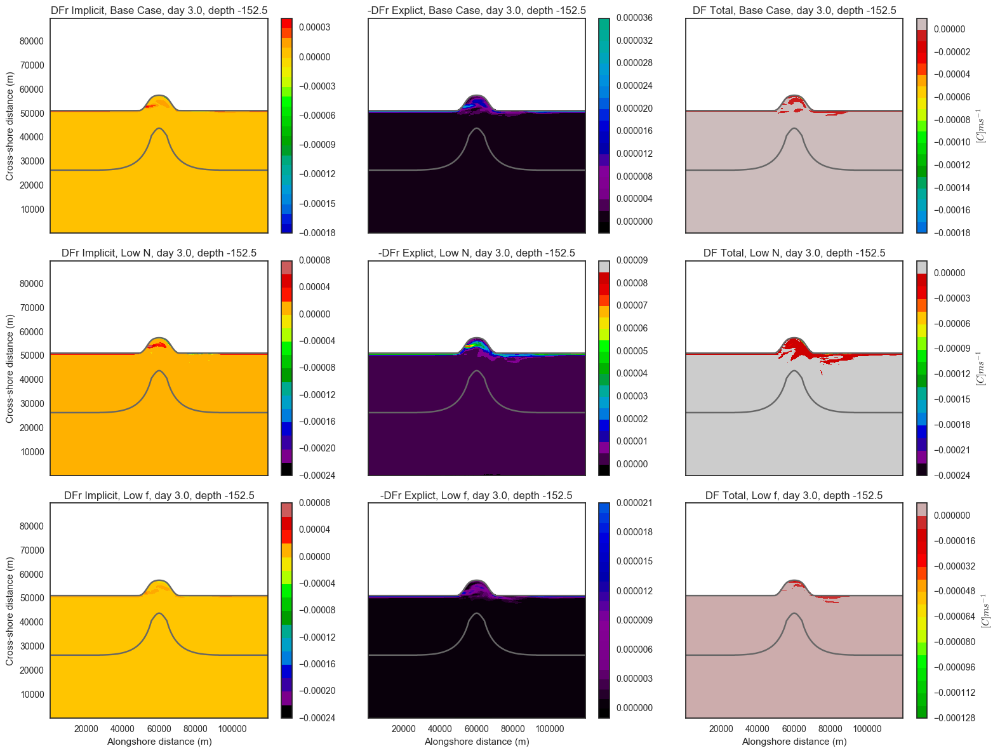

In [148]:
make_fig_Bu(5,30)

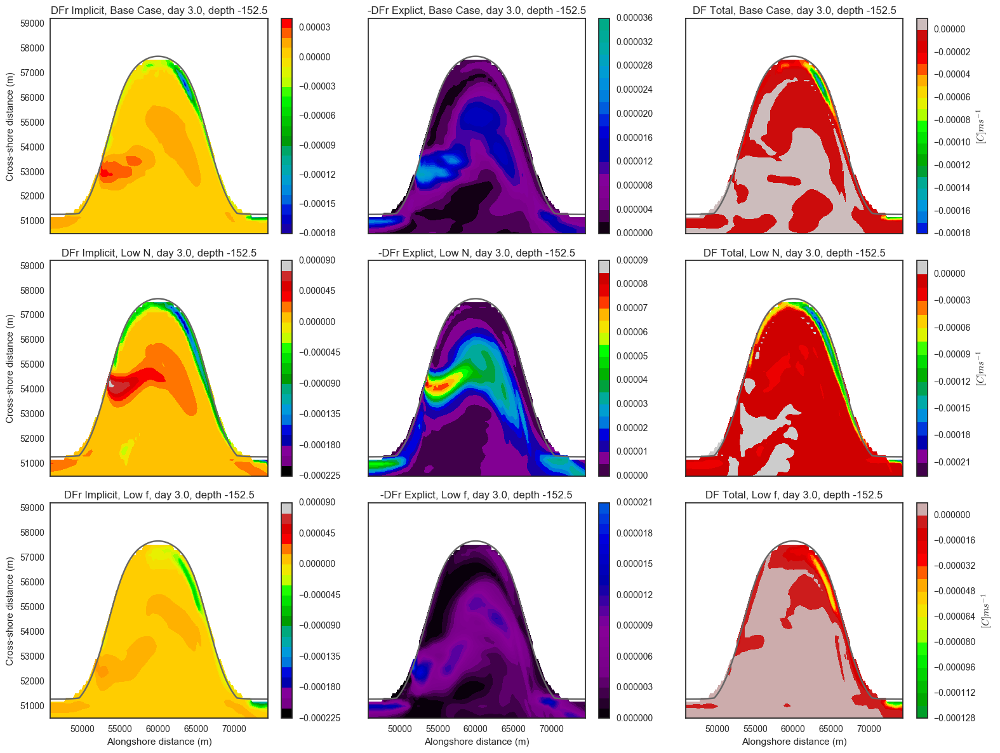

In [149]:
make_fig_Bu(5,30,xslice=slice(100, 261), yslice=slice(220, 267))

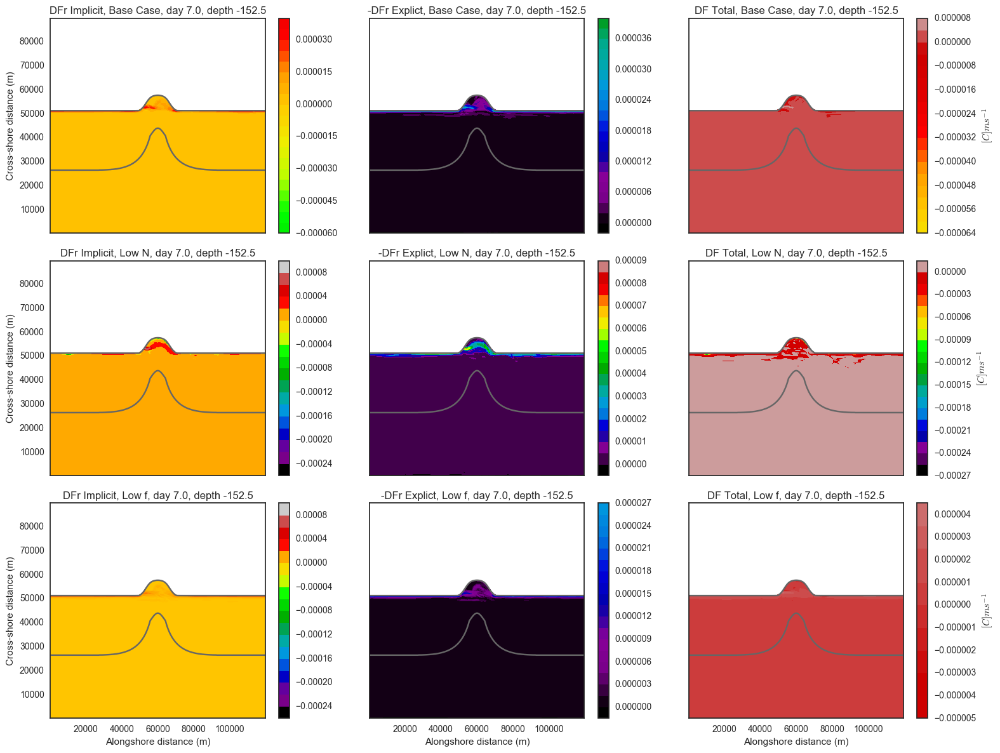

In [150]:
make_fig_Bu(13,30)

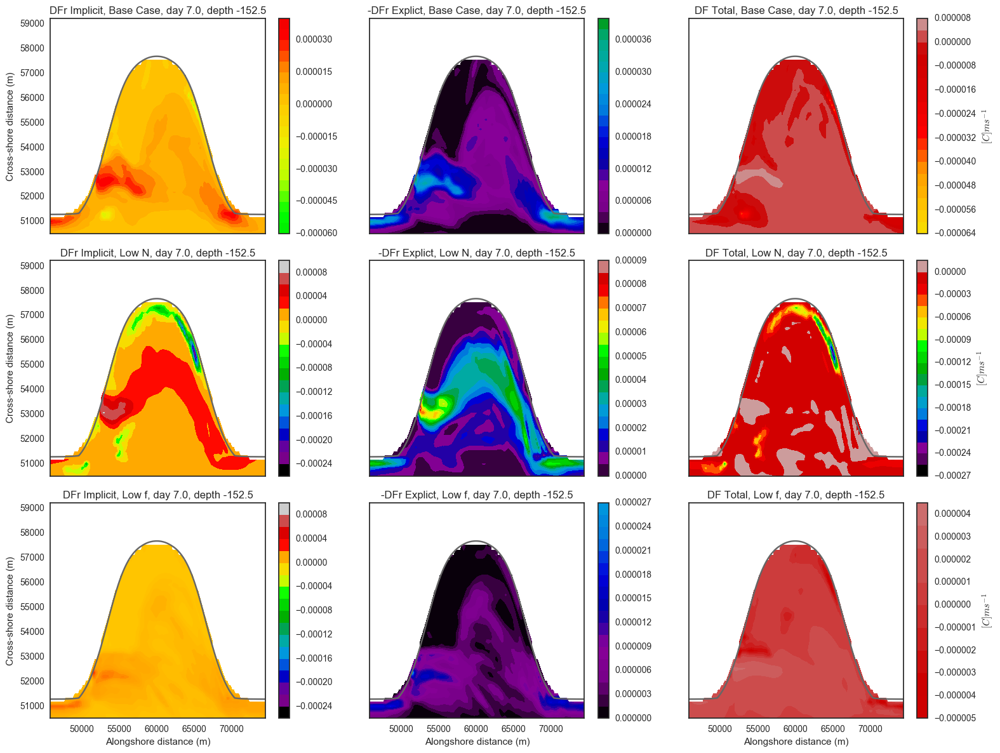

In [151]:
make_fig_Bu(13,30,xslice=slice(100, 261), yslice=slice(220, 267))

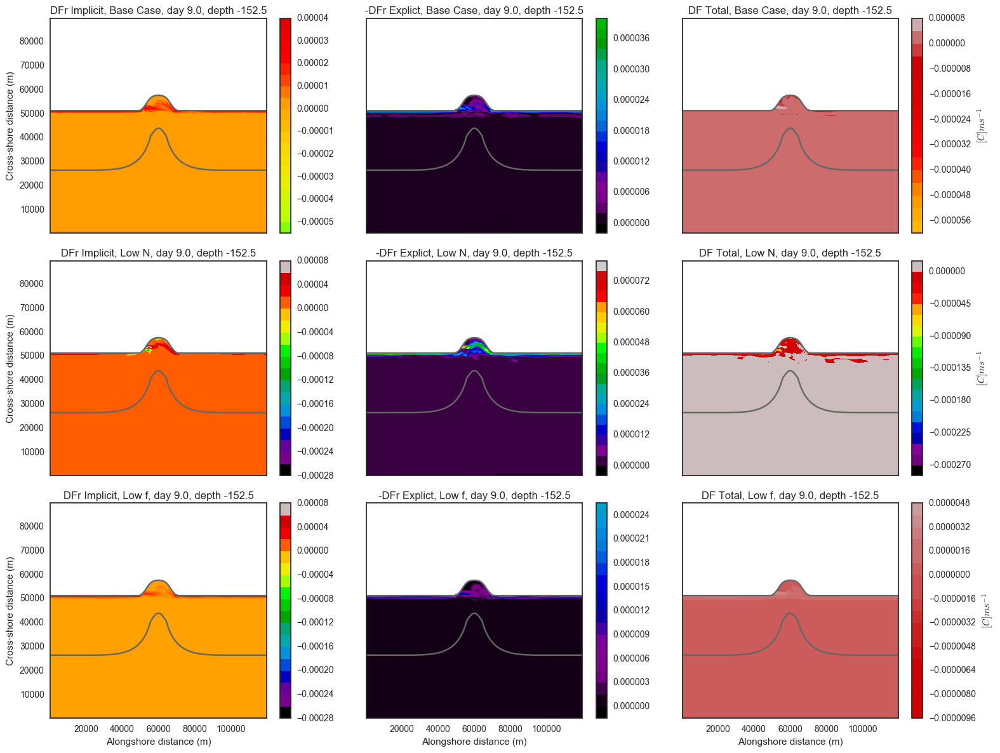

In [152]:
make_fig_Bu(17,30)

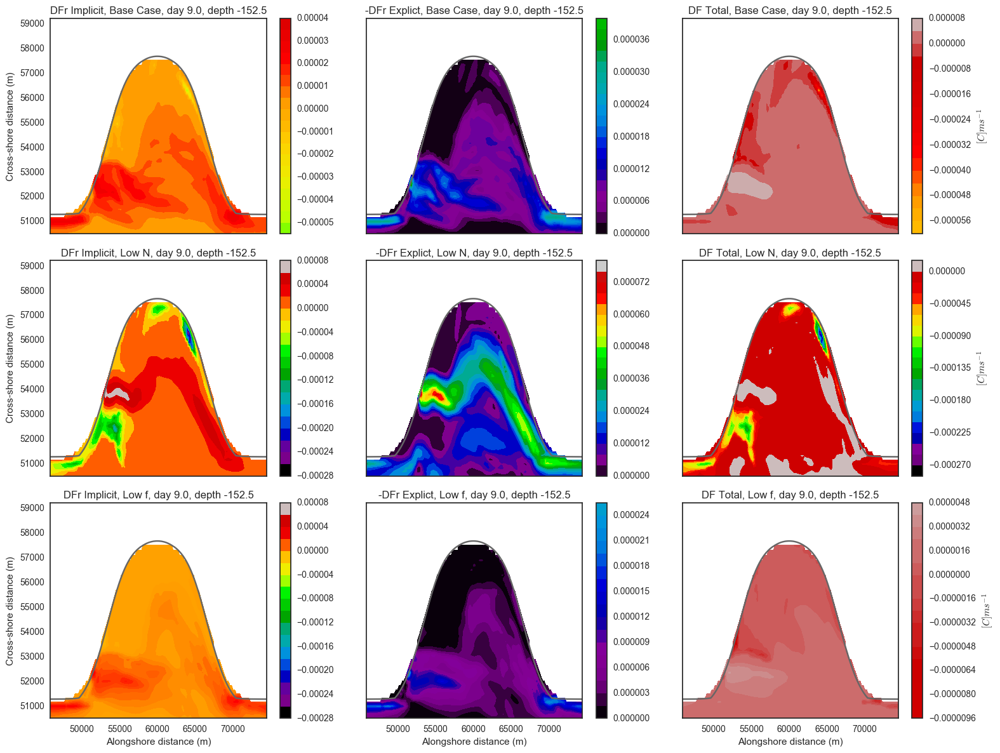

In [153]:
make_fig_Bu(17,30,xslice=slice(100, 261), yslice=slice(220, 267))

## Bu, Below shelf break depth

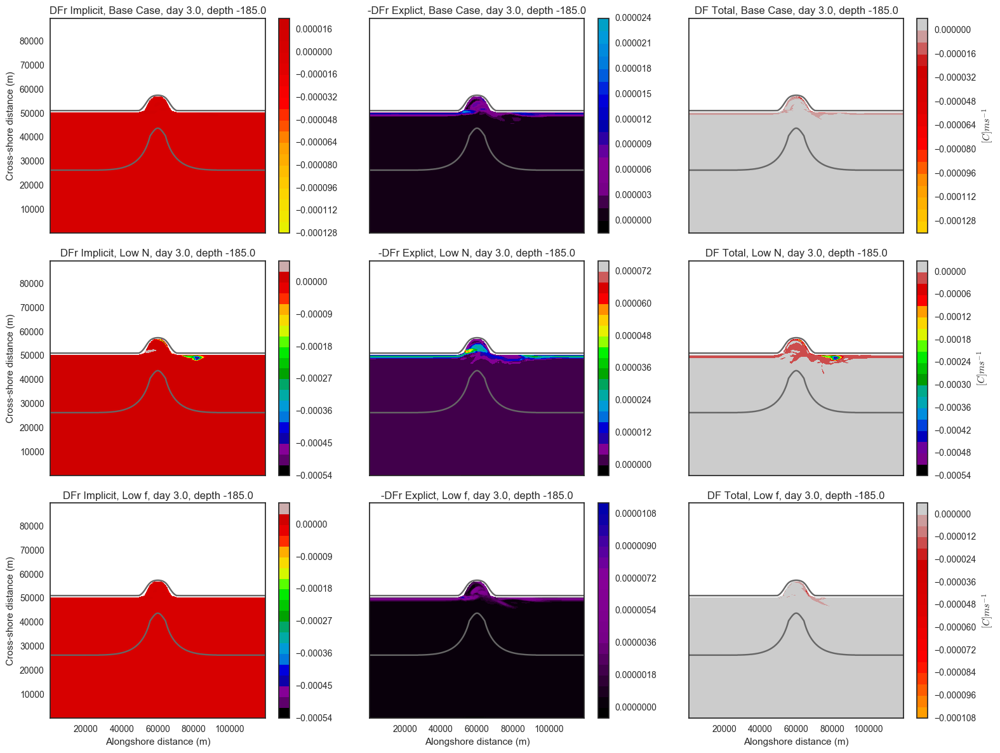

In [154]:
make_fig_Bu(5,35)

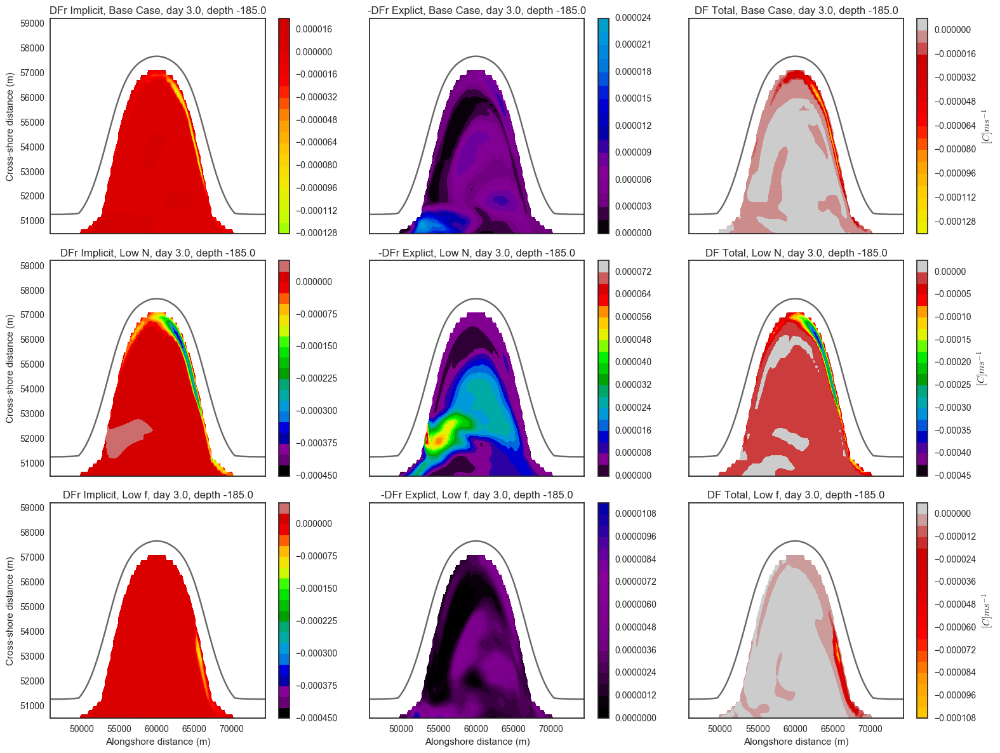

In [155]:
make_fig_Bu(5,35,xslice=slice(100, 261), yslice=slice(220, 267))

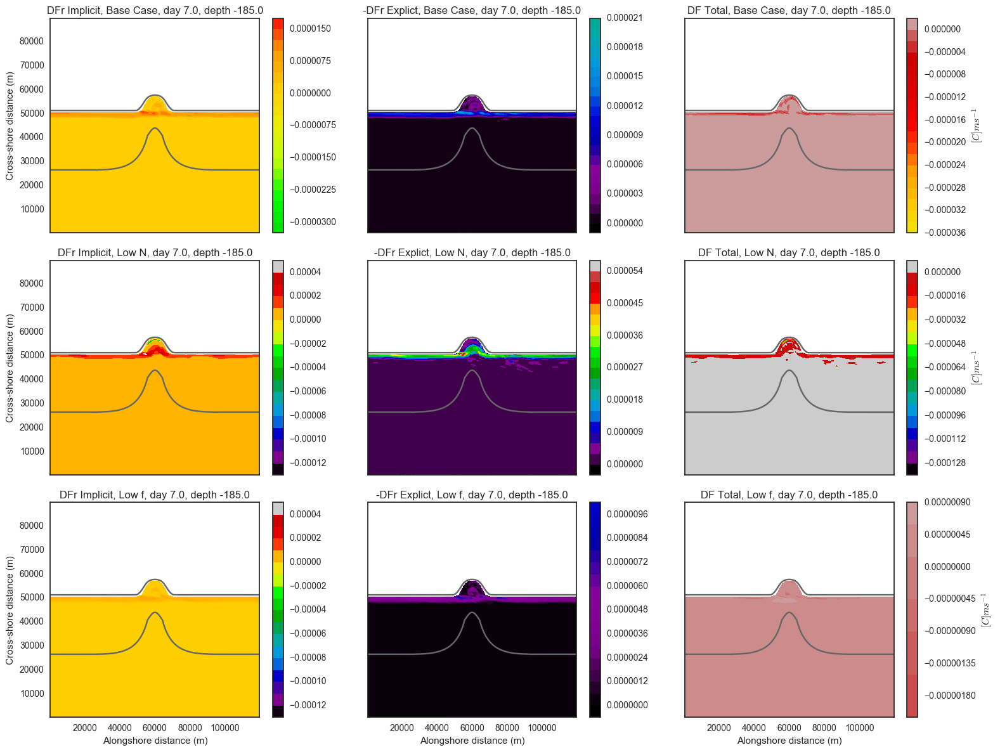

In [156]:
make_fig_Bu(13,35)

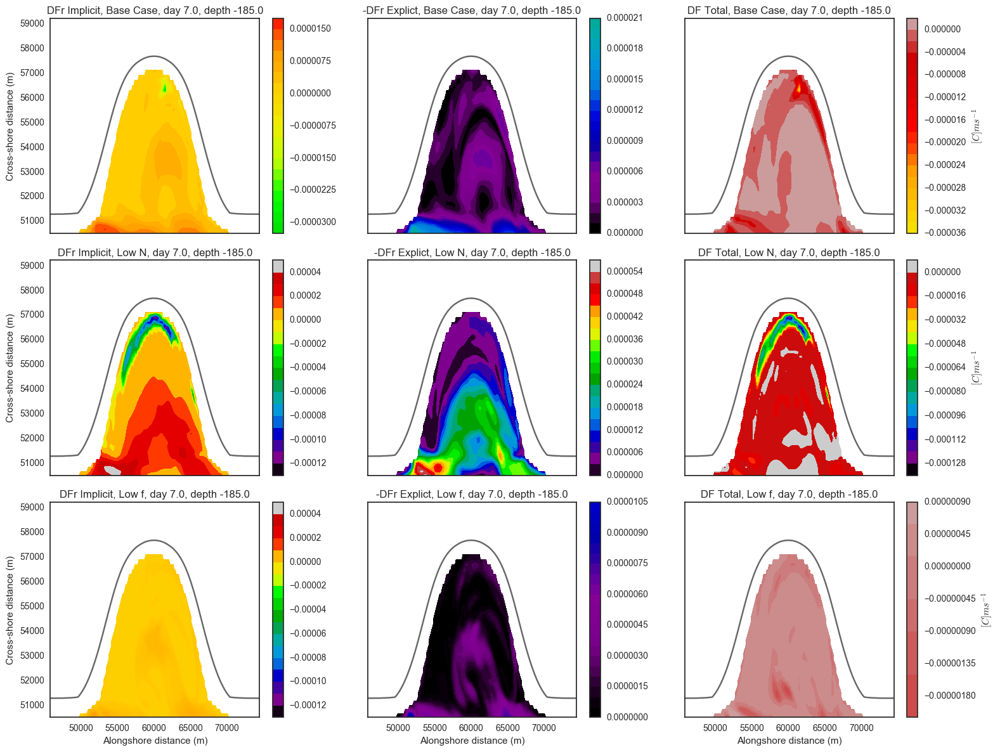

In [157]:
make_fig_Bu(13,35,xslice=slice(100, 261), yslice=slice(220, 267))

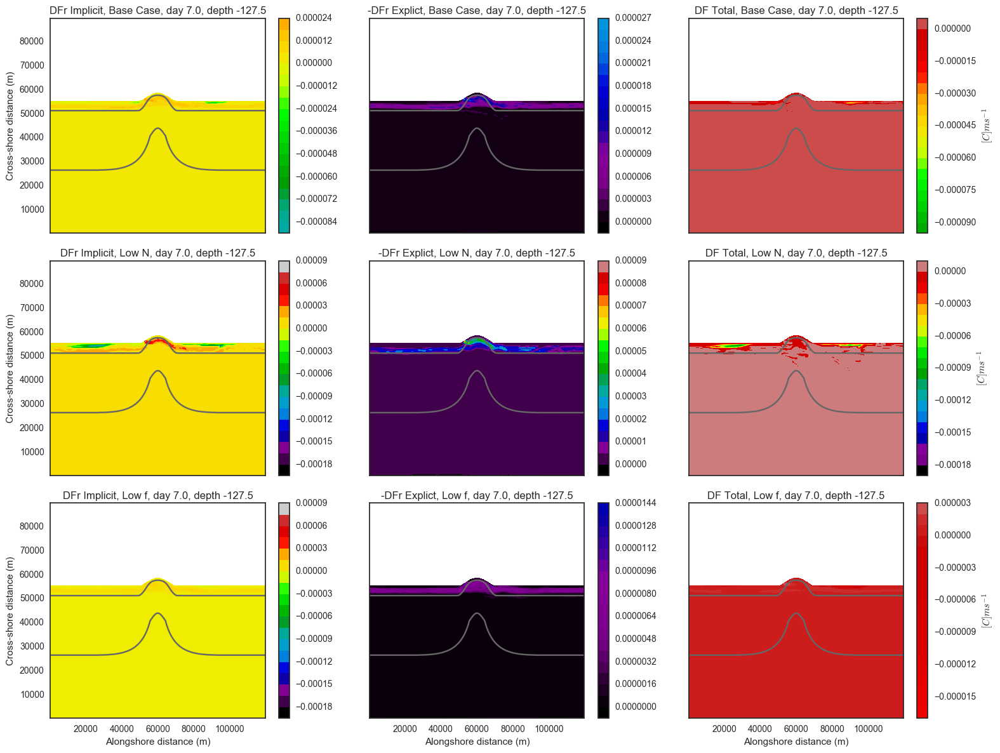

In [159]:
make_fig_Bu(13,25)

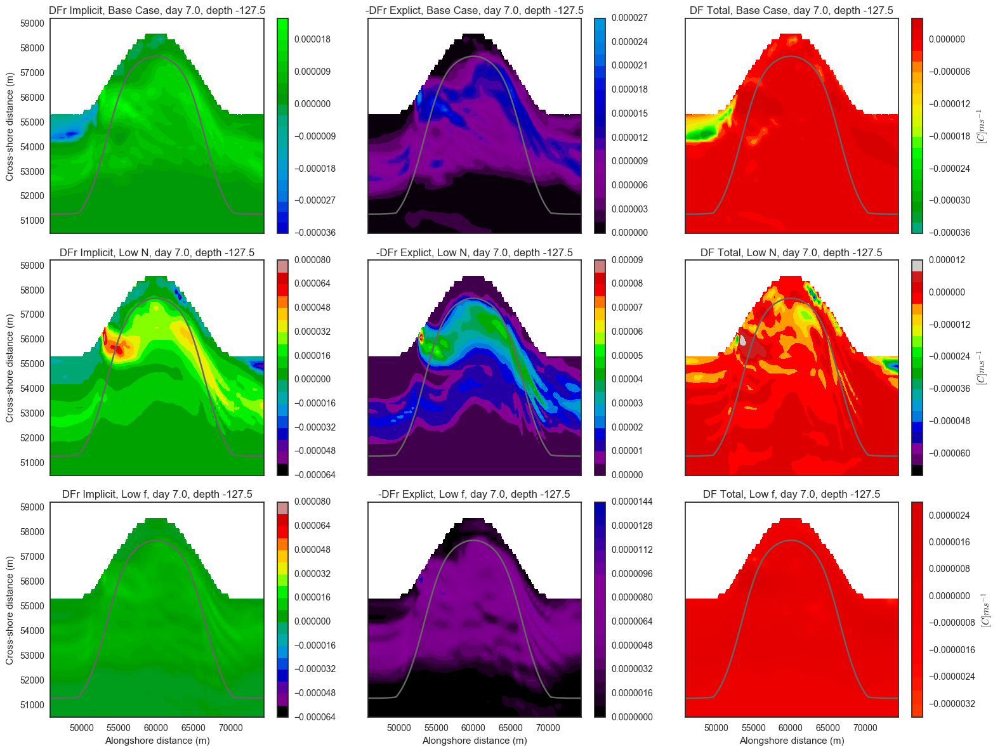

In [160]:
make_fig_Bu(13,25,xslice=slice(100, 261), yslice=slice(220, 267))

# Enhanced diffusivity

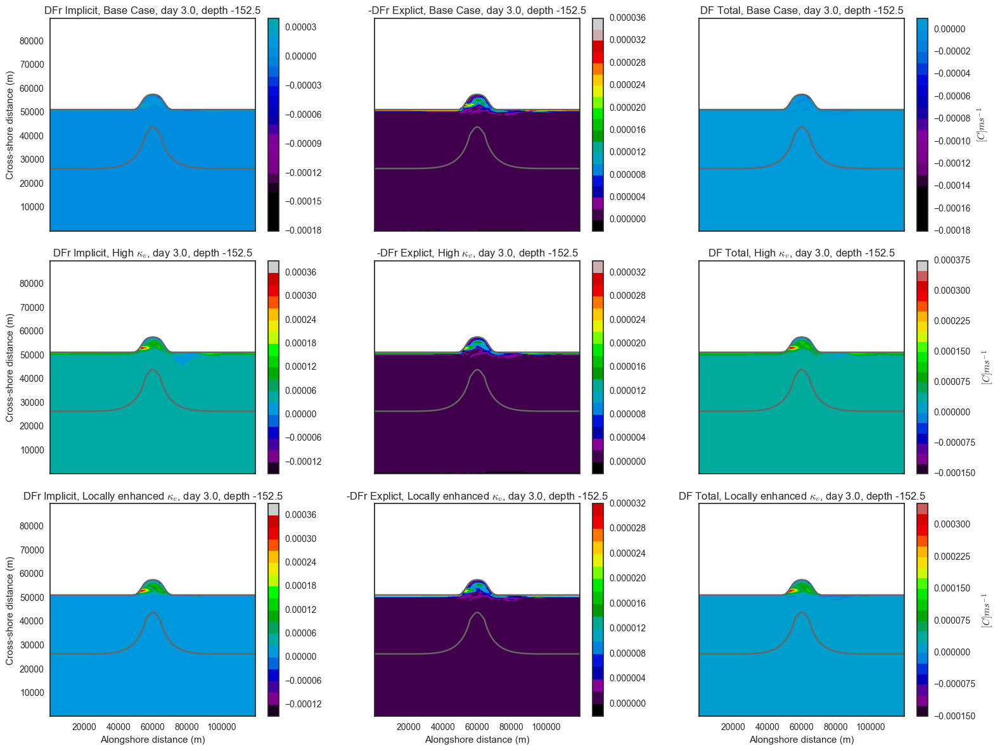

In [162]:
make_fig_Kv(5,30)

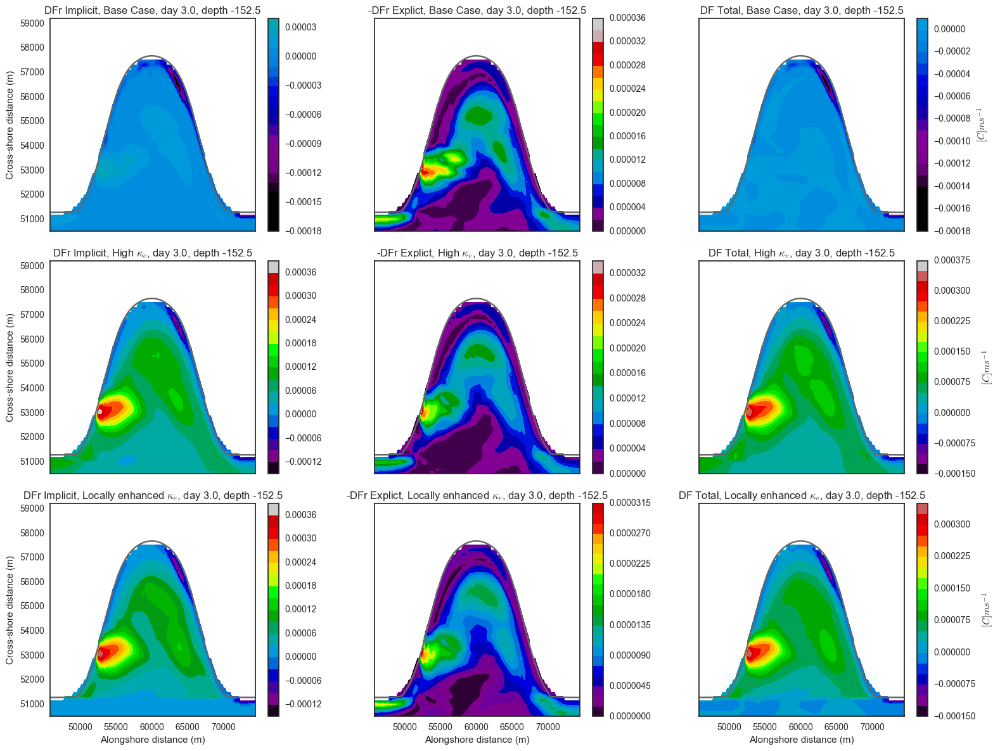

In [163]:
make_fig_Kv(5,30,xslice=slice(100,261),yslice=slice(220,267))

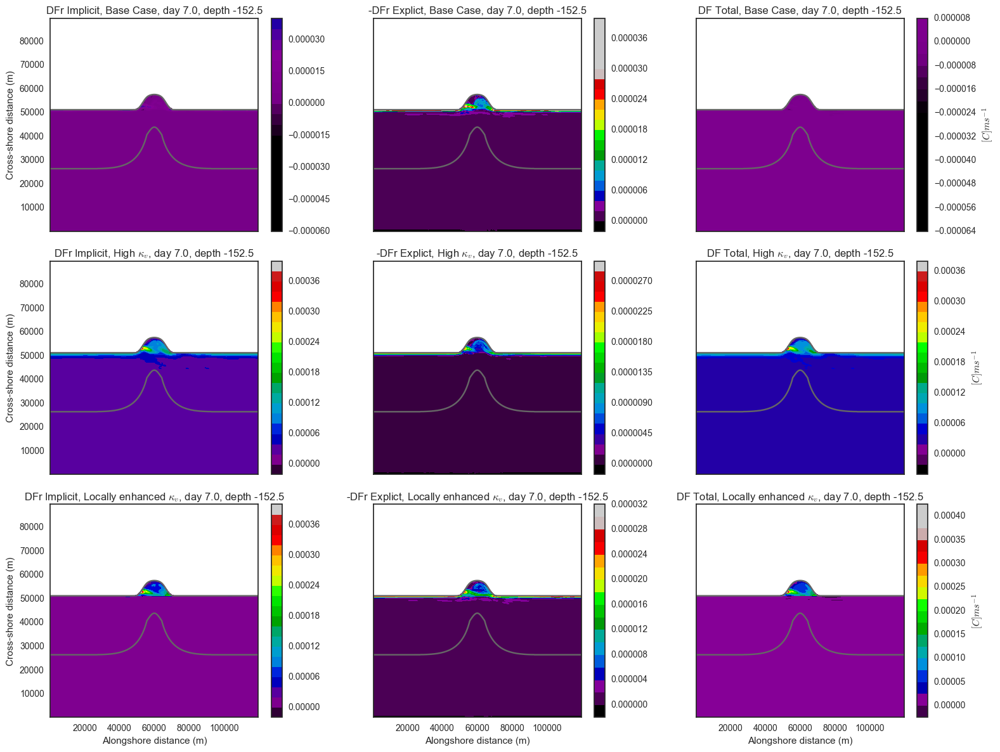

In [164]:
make_fig_Kv(13,30)

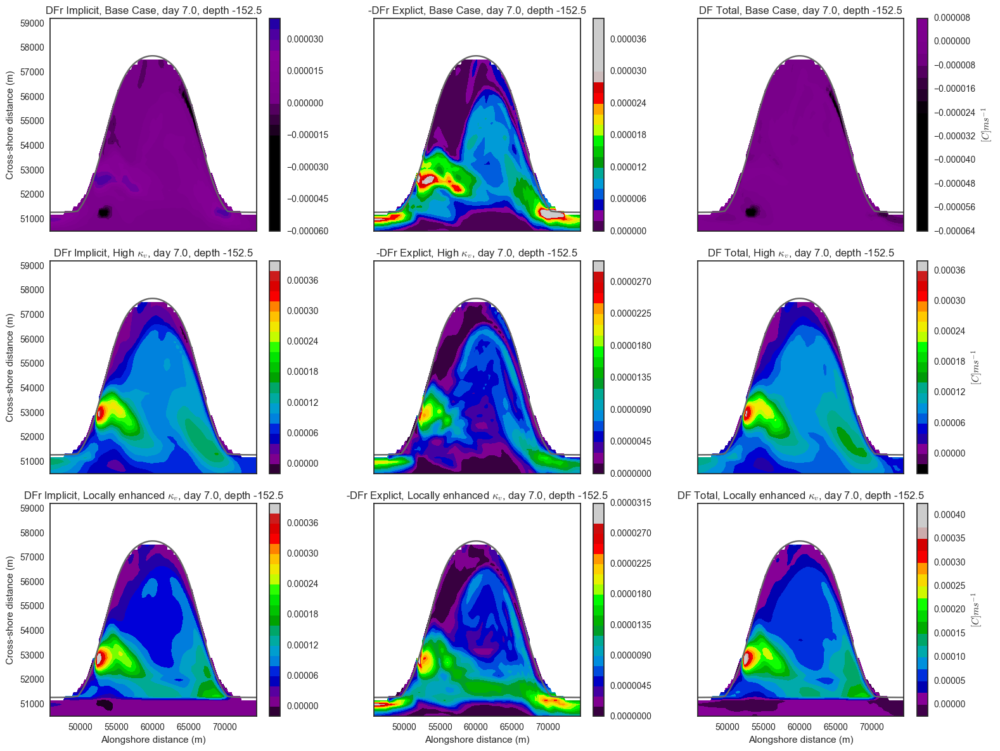

In [165]:
make_fig_Kv(13,30,xslice=slice(100,261),yslice=slice(220,267))

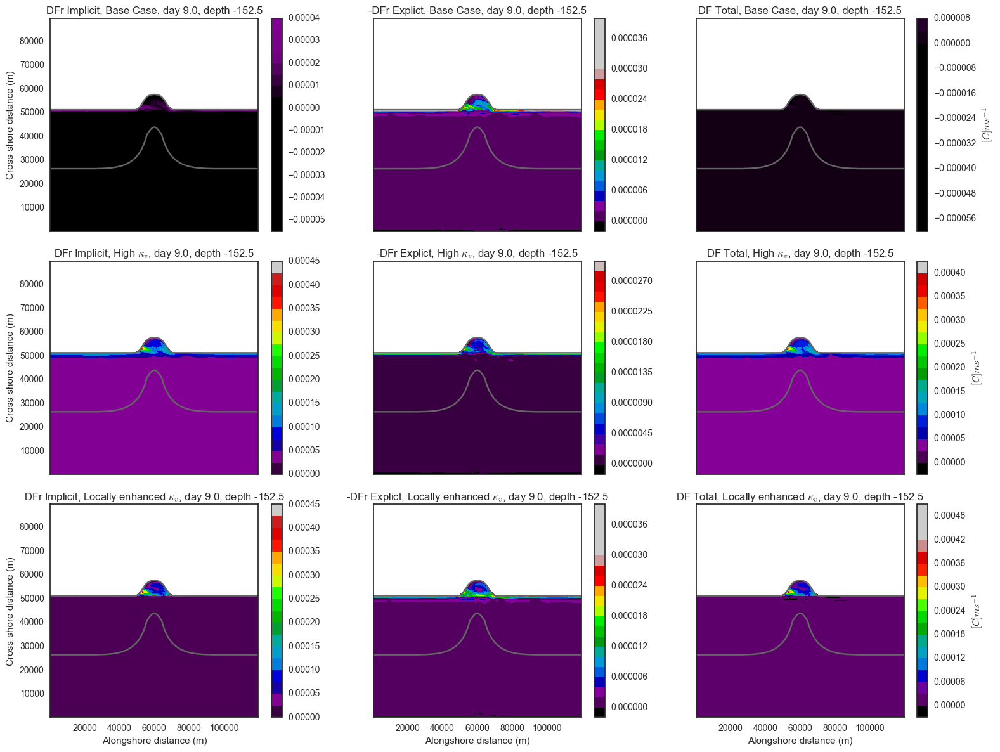

In [166]:
make_fig_Kv(17,30)

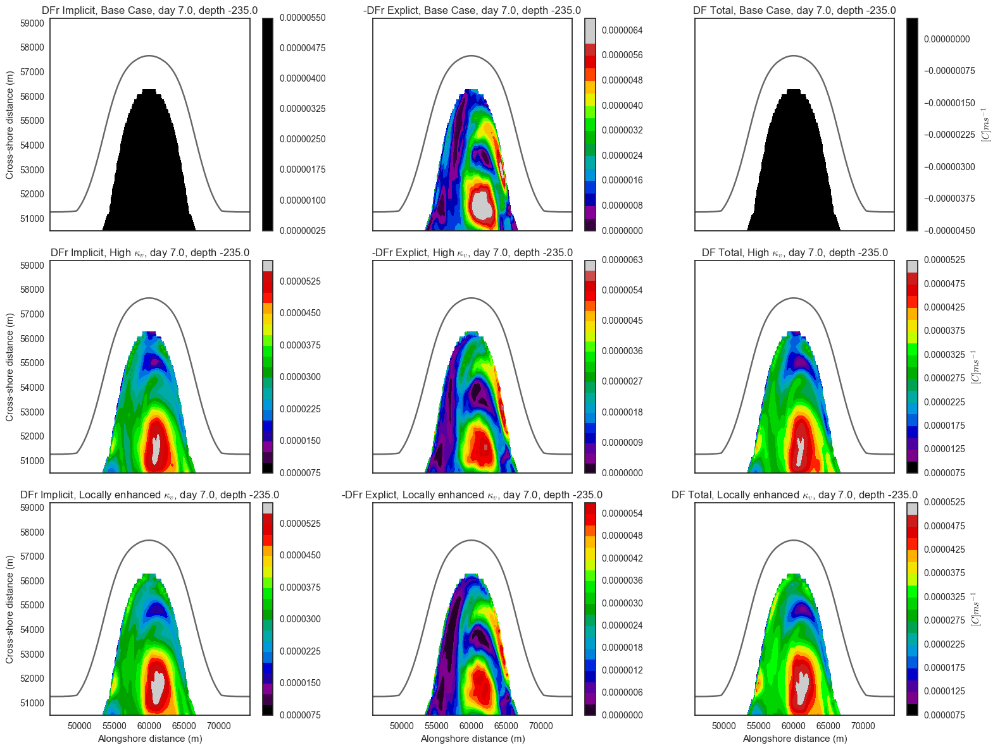

In [173]:
make_fig_Kv(13,40,xslice=slice(100,261),yslice=slice(220,267))

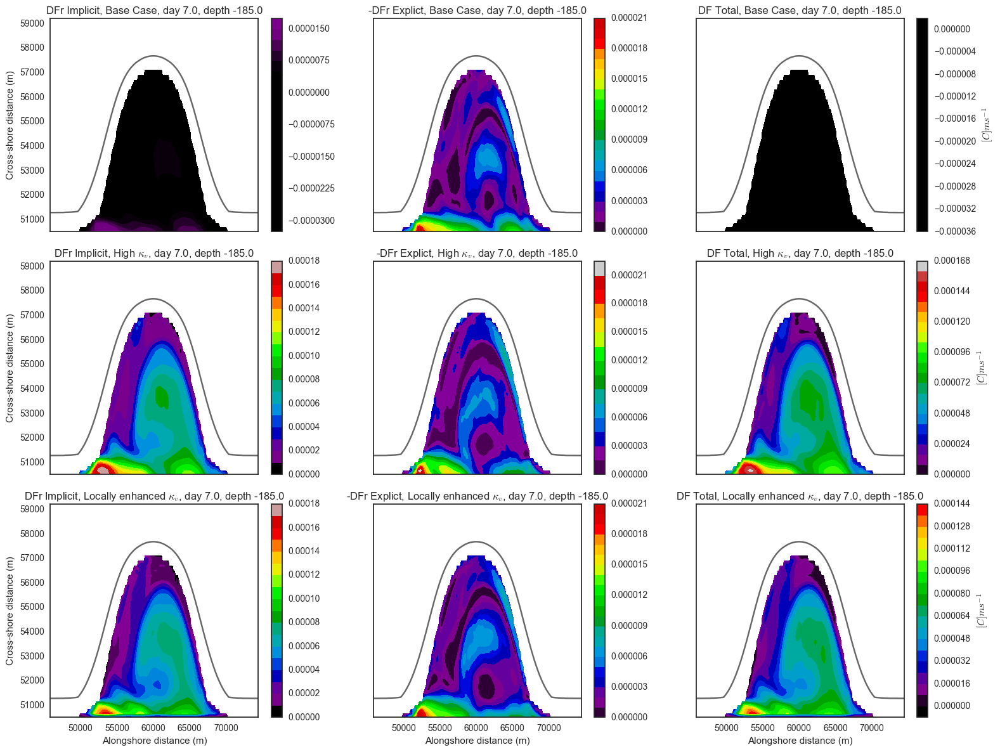

In [174]:
make_fig_Kv(13,35,xslice=slice(100,261),yslice=slice(220,267))

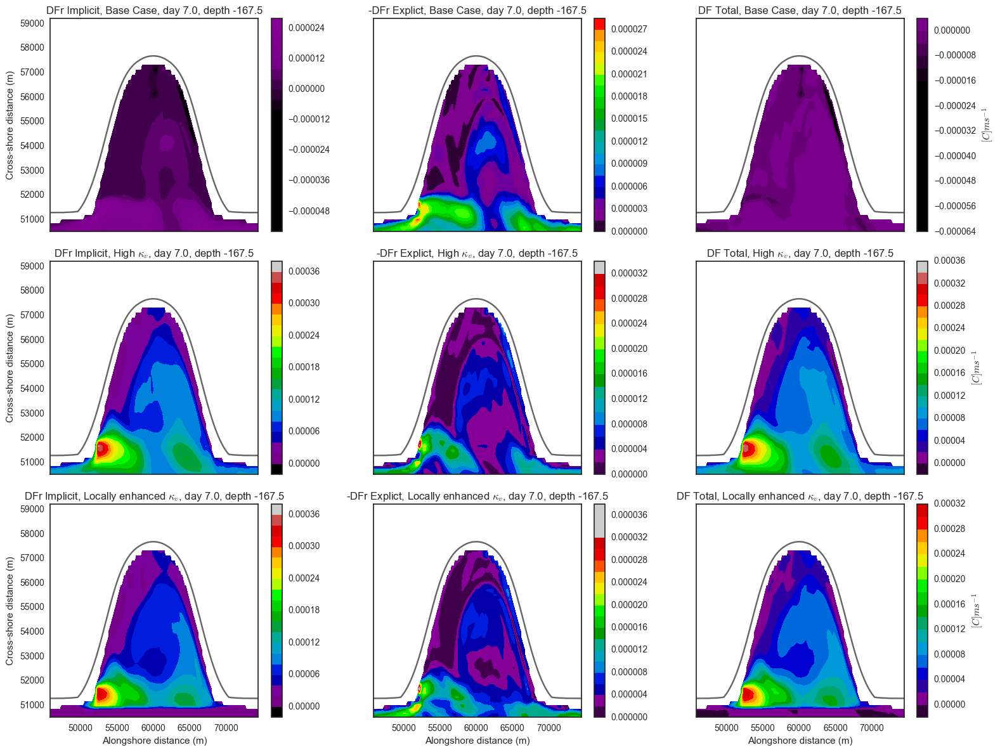

In [175]:
make_fig_Kv(13,33,xslice=slice(100,261),yslice=slice(220,267))

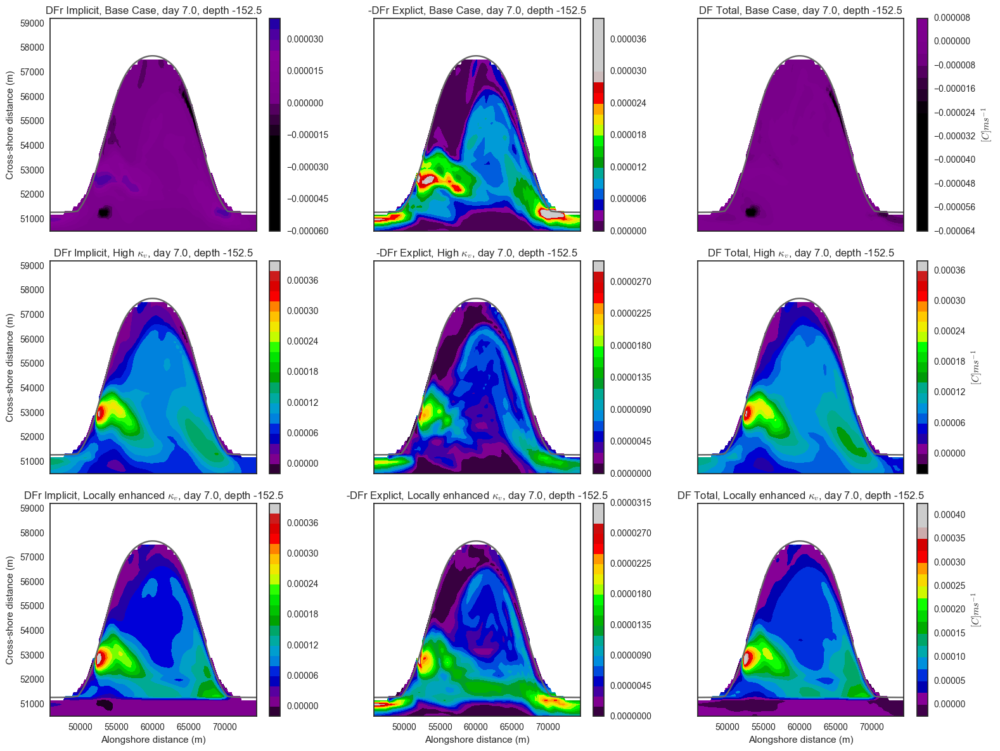

In [177]:
make_fig_Kv(13,30,xslice=slice(100,261),yslice=slice(220,267))

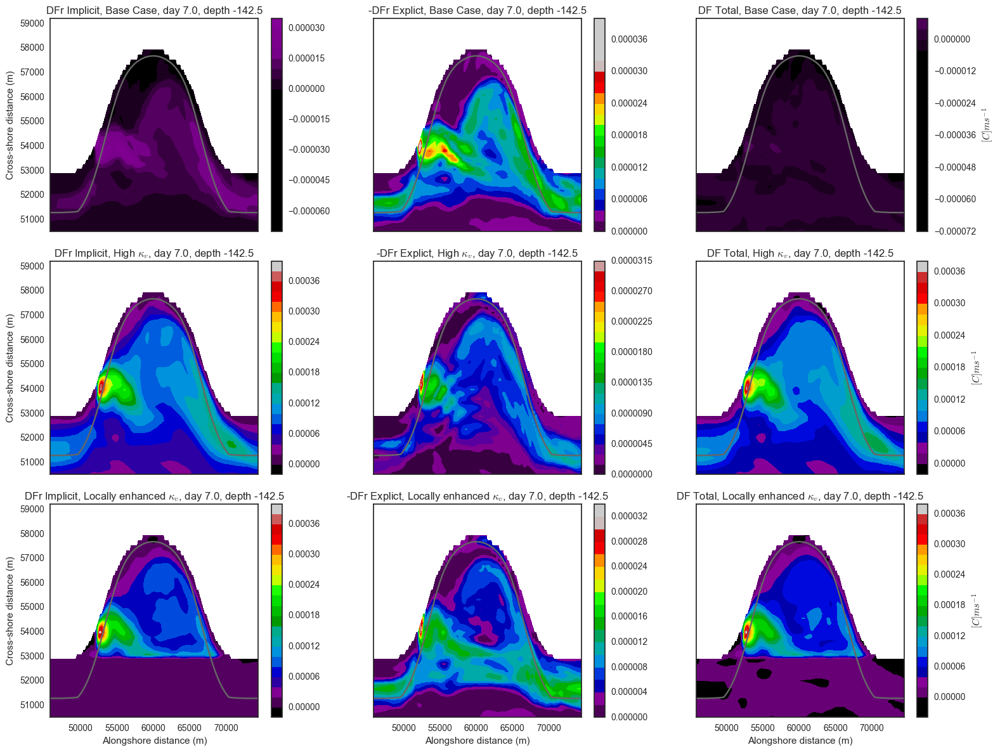

In [179]:
make_fig_Kv(13,28,xslice=slice(100,261),yslice=slice(220,267))

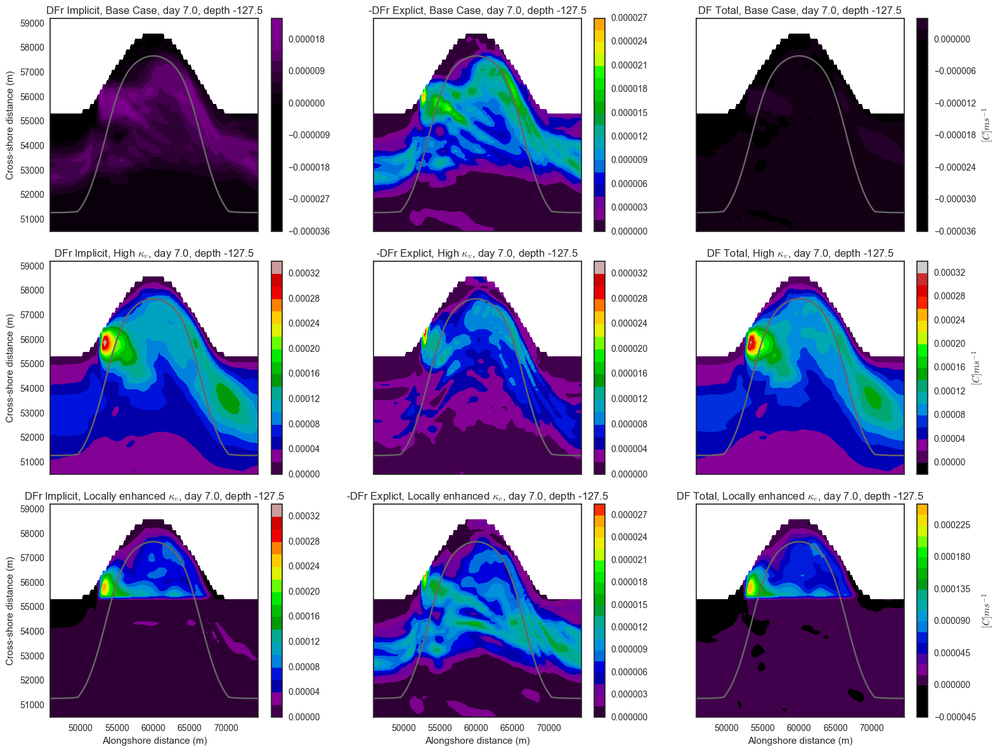

In [180]:
make_fig_Kv(13,25,xslice=slice(100,261),yslice=slice(220,267))

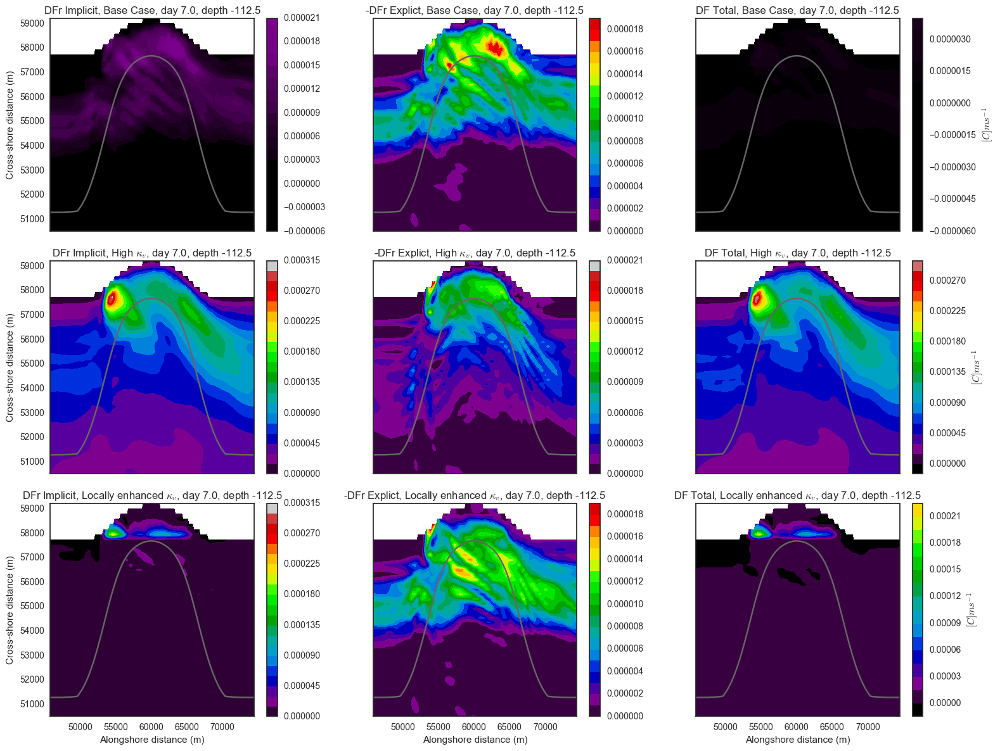

In [181]:
make_fig_Kv(13,22,xslice=slice(100,261),yslice=slice(220,267))

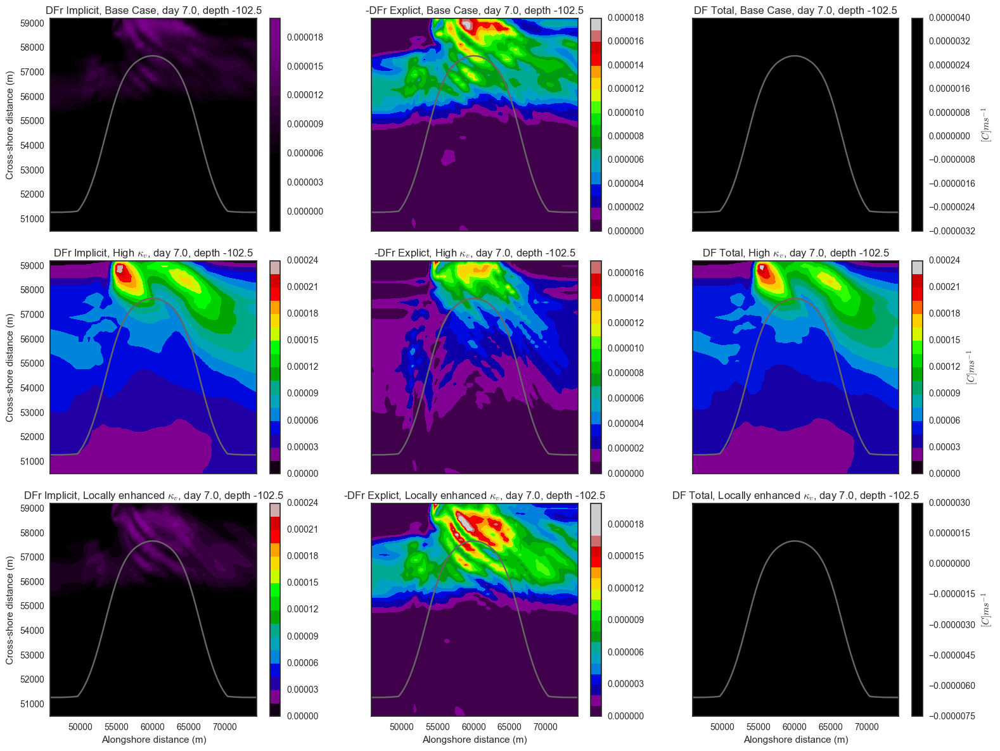

In [182]:
make_fig_Kv(13,20,xslice=slice(100,261),yslice=slice(220,267))